# Case Studies

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import pickle
import pynbody
pynbody.config['halo-class-priority'] =  [pynbody.halo.ahf.AHFCatalogue,
                                          pynbody.halo.GrpCatalogue,
                                          pynbody.halo.AmigaGrpCatalogue,
                                          pynbody.halo.legacy.RockstarIntermediateCatalogue,
                                          pynbody.halo.rockstar.RockstarCatalogue,
                                          pynbody.halo.subfind.SubfindCatalogue, pynbody.halo.hop.HOPCatalogue]

%matplotlib inline
mpl.rc('font',**{'family':'serif','monospace':['Palatino']})
mpl.rc('text', usetex=True)
mpl.rcParams.update({'font.size': 9})

In [2]:
def read_file(path, halo_num):
    data = []
    with open(path,'rb') as f:
        while True:
            try: 
                data.append(pickle.load(f))
            except EOFError:
                break
    data = pd.DataFrame(data)
    
    if not halo_num=='all':
        data = data[data.z0haloid == halo_num]

    return data

def cumulative_sfh(halo_num):
    age = 13.800797497330507
    s = pynbody.load('/home/christenc/Data/Sims/h242.cosmo50PLK.3072g/h242.cosmo50PLK.3072gst5HbwK1BH/snapshots/h242.cosmo50PLK.3072gst5HbwK1BH.004096')
    halo = s.halos()[halo_num]
    try:
        sfh, bins = pynbody.plot.stars.sfh(halo, filename=None, massform=False, clear=False, legend=False, subplot=False, trange=False, bins=128)
        plt.clf()
    except ValueError:
        print(f'Cannot create SFH, only {len(halo.s)} star particles')
        raise

    sfhmstar = np.sum(sfh)
    bincenters = 0.5*(bins[1:]+bins[:-1])
    c_sfh = np.empty(shape=sfh.shape)
    for i in range(len(bincenters)):
        c_sfh[i] = np.sum(sfh[:i+1])/sfhmstar 
    return c_sfh, age-bincenters

4 	 0.50
7 	 6.36
10 	 0.36
11 	 5.44
12 	 12.31
20 	 7.31
21 	 1.03
27 	 0.47
31 	 2.09
35 	 1.21
36 	 3.05
37 	 1.09
45 	 2.92
47 	 4.73
48 	 0.56
49 	 4.42
59 	 9.32
64 	 6.87
65 	 4.14
67 	 1.97
68 	 12.72
70 	 9.97
71 	 0.96
77 	 6.08
81 	 1.63
90 	 5.51
100 	 7.08
102 	 0.76
131 	 0.52
137 	 6.46
195 	 8.68
205 	 12.55
407 	 1.17
418 	 0.61
443 	 5.51


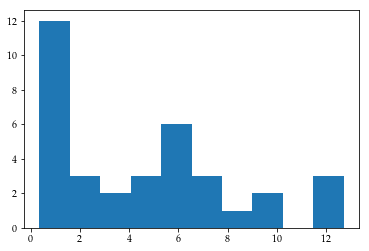

In [24]:
data = read_file('/home/akinshol/Data/Timescales/DataFiles/h242.data','all')
data = data[data.time > 13.6]

for haloid,h1dist in zip(data.haloid,data.h1dist):
    print(int(haloid),'\t','%.2f' % h1dist)
plt.hist(data.h1dist)
plt.show()

In [39]:
def CaseStudyPlots(i,simulation_name,showram=True,filename=True):
    path = '/home/akinshol/Data/Timescales/DataFiles/'+str(simulation_name)+'.data'

    data = read_file(path, i)
    # data[:10]

    age = 13.800797497330507
    q_thresh = 0.9
    i_thresh = 1.0
    
    print('Gathering data...')
    time = age - np.array(data['time'], dtype=float)
    gasfrac = np.array(data['gasfrac'], dtype=float)
    gastemp = np.array(data['gtemp'], dtype=float)
    ratio = np.array(data['ratio'], dtype=float)
    dist = np.array(data['h1dist'], dtype=float)
    SNHf = np.array(data['SNHfrac'], dtype=float)
    fHI = np.array(data['fHI'], dtype=float)
    mvir = np.array(data['mass'], dtype=float)
    HIratio = np.array(data['HIratio'], dtype=float)
    mHI = np.array(data['HIratio'],dtype=float)*np.array(data['mstar'],dtype=float)
    mgas = np.array(data['mgas'],dtype=float)
    c_sfh, bc = cumulative_sfh(i)

    shaded_min = -1
    shaded_max = 500*np.max(mgas)

    fig, ax = plt.subplots(1,1,figsize=(4,4), dpi=100)
    ax.plot(time,dist,'g-')
    ax.invert_xaxis()
    ax.set_xlabel('Lookback Time [Gyr]')
    label3 = ax.set_ylabel(r'Distance from Host [$R_{\mathrm{vir}}$]')
    label3.set_color('g')
    ax.semilogy()
    ax.set_xlim(14,0)
    ax.set_ylim(0.1, 25)

    ax1 = ax.twinx()
    ax1.plot(time,ratio,'m-')
    label4 = ax1.set_ylabel(r'$P_{\mathrm{ram}} / P_{\mathrm{rest}}$')
    label4.set_color('m')
    try:
        ax1.set_ylim(np.min(ratio[~np.isnan(ratio)])-0.3, np.max(ratio[~np.isnan(ratio)])+1)
        npeaks = 1
        peak_indices = np.argsort(ratio[~np.isnan(ratio)])[-npeaks:]

        for index in peak_indices:
            t = time[~np.isnan(ratio)][index]
            ax[i].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)
    except:
        pass


    ax.fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')


    if showram:
        plt.show()

    fig, ax = plt.subplots(1,3,figsize=(18,4),dpi=300)
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    try:
        for i in [0,1,2]:
            for index in peak_indices:
                t = time[~np.isnan(ratio)][index]
                ax[i].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)
    except:
        pass
    
    
    ax[0].plot(bc, c_sfh, 'r-')
    ax[0].invert_xaxis()
    ax[0].set_xlabel('Lookback Time [Gyr]')
    label1 = ax[0].set_ylabel('Cumulative, Normalized SFH')
    label1.set_color('r')
    ax[0].set_ylim(-0.05,1.05)
    ax[0].set_xlim(14,0)

    ax0 = ax[0].twinx()
    ax0.plot(time,HIratio,'b-')
    ax0.set_ylim(-1,10)
    label2 = ax0.set_ylabel(r'$M_{\mathrm{HI}}\ /\ M_{*}$')
    label2.set_color('b')
    try:
        t = np.max(bc[c_sfh >= 0.99])
    except:
        pass

    for i in [0,1,2]:
        ax[i].plot([t,t],[shaded_min,shaded_max], 'r--', linewidth=1)


    ax[1].plot(time,mHI,color='#370ec2',label='HI', linestyle='-')
    ax[1].plot(time,mgas,color='#370ec2',label='All Gas', linestyle='--')
    ax[1].set_xlabel('Lookback Time [Gyr]')
    label = ax[1].set_ylabel(r'Gas Mass [$M_{\odot}$]')
    label.set_color('#370ec2')
    ax[1].legend(frameon=False)
    ax[1].semilogy()
    ax[1].invert_xaxis()
    ax[1].set_xlim(14,0)
    allgas = np.append(mgas,mHI)
    allgas = allgas[~np.isnan(allgas)]
    ax[1].set_ylim(0.5*np.min(allgas),1.4*np.max(allgas))

    ax1 = ax[1].twinx()
    ax1.plot(time,gastemp,'k-')
    ax1.invert_xaxis()
    ax1.set_xlabel('Lookback Time [Gyr]')
    ax1.set_ylabel('Mean Gas Temperature [K]')
    ax1.set_xlim(14,0)
    try:
        ax1.set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.05*np.max(gastemp[~np.isnan(gastemp)]))
    except:
        pass

    # ax[2].set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.4*np.max(gastemp[~np.isnan(gastemp)]))
    # ax[2].plot(time,data['outflow_temp_23'],label='Outflow')
    # ax[2].plot(time,data['inflow_temp_23'],label='Inflow')
    # ax[2].legend(frameon=False, prop={'size':9})
    # ax[2].semilogy()


    netflux = data['outflow_91'] + data['inflow_91']
    # ax[2].plot(time, netflux, color='#ad7617', linestyle='-')
    # ax[2].invert_xaxis()
    # label5 = ax[2].set_ylabel(r'Net Gas Flux [$M_{\mathrm{\odot}}\ \mathrm{yr}^{-1}$]')
    # label5.set_color('#ad7617')
    # ax[2].set_ylim(1.2*np.min(netflux),1.2*np.max(netflux))
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min,shaded_max, where=(netflux < 0.), edgecolor='none',alpha=0.2, facecolor='#ad7617')

    ax[2].invert_xaxis()
    ax[2].plot(time,abs(data['outflow_91']), color='r',label='outflow')
    ax[2].plot(time,abs(data['inflow_91']), color='orange', label='inflow')
    ax[2].set_ylabel('Outflow Rate / Inflow Rate')
    ax[2].legend(frameon=False)
    alloutflows = np.append(abs(data['outflow_91']),abs(data['inflow_91']))
    alloutflows = alloutflows[~np.isnan(alloutflows)]
    try:
        ax[2].set_ylim(-0.001,1.3*np.max(alloutflows))
    except:
        pass
    ax[2].set_xlim(14,0)

    ax2 = ax[2].twinx()
    ax2.plot(time,SNHf, c='b')
    label = ax2.set_ylabel('SN Heated Fraction')
    label.set_color('b')


    plt.subplots_adjust(wspace=0.45)
    if filename:
        f = 'case_study_'+str(simulation_name)+'_'+str(i)+'.png'
        plt.savefig('CaseStudyPlots/'+f, dpi=300)
    else:
        plt.savefig('CaseStudyPlots/'+str(filename), dpi=300)
    plt.show()

Halo 4.0
Gathering data...


<Figure size 432x288 with 0 Axes>

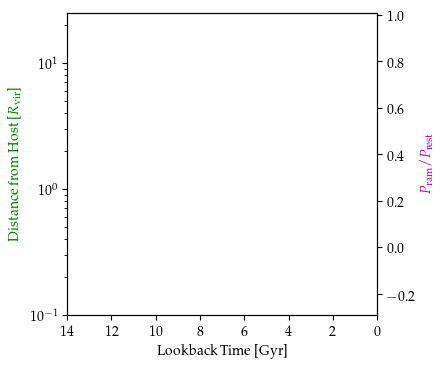

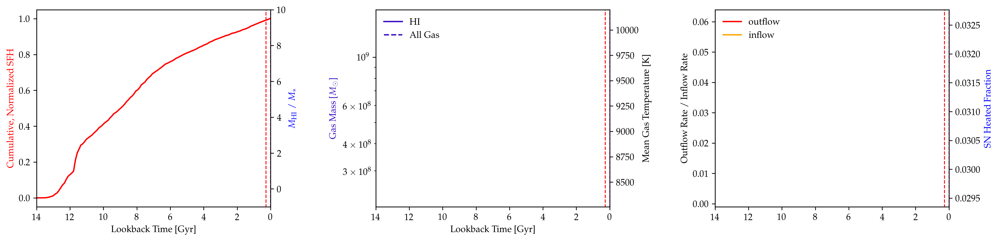

Halo 7.0
Gathering data...


<Figure size 432x288 with 0 Axes>

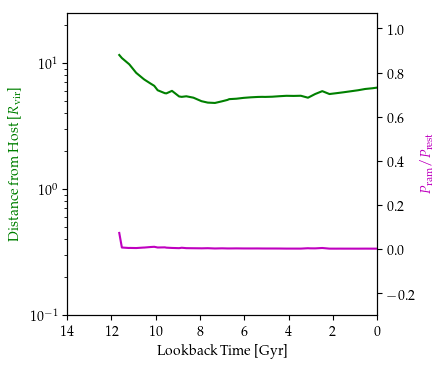

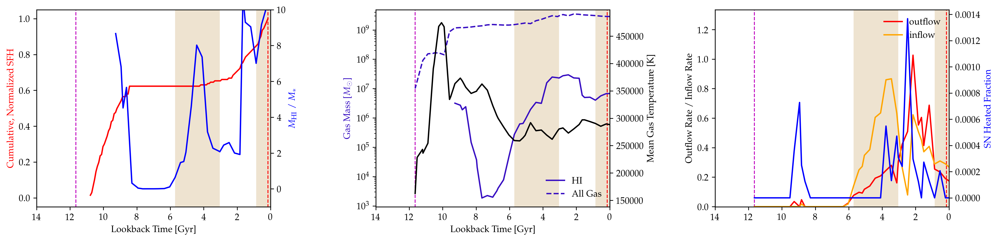

Halo 10.0
Gathering data...


<Figure size 432x288 with 0 Axes>

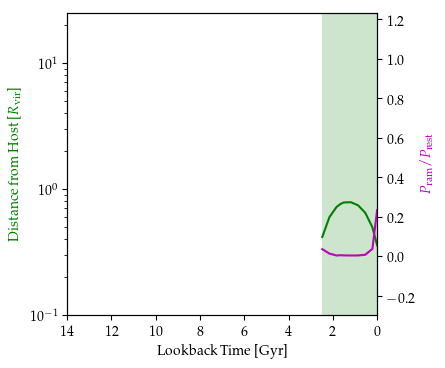

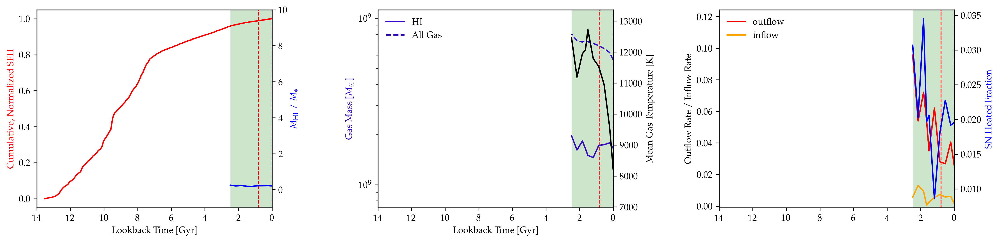

Halo 11.0
Gathering data...


<Figure size 432x288 with 0 Axes>

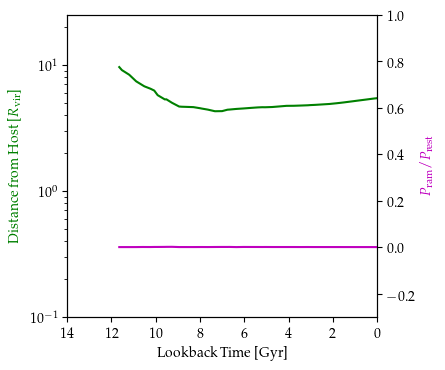

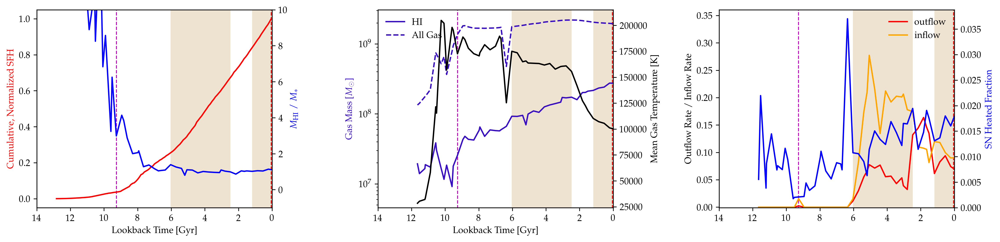

Halo 12.0
Gathering data...


<Figure size 432x288 with 0 Axes>

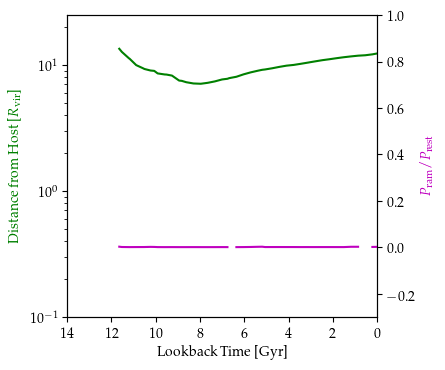

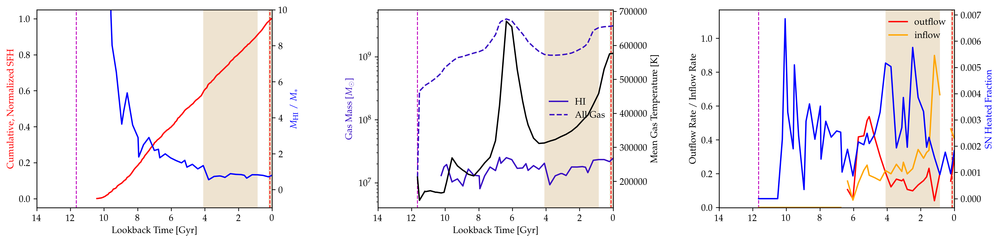

Halo 20.0
Gathering data...


<Figure size 432x288 with 0 Axes>

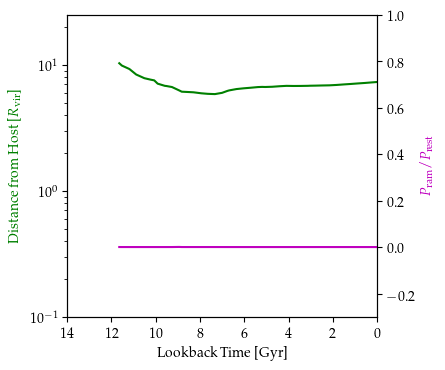

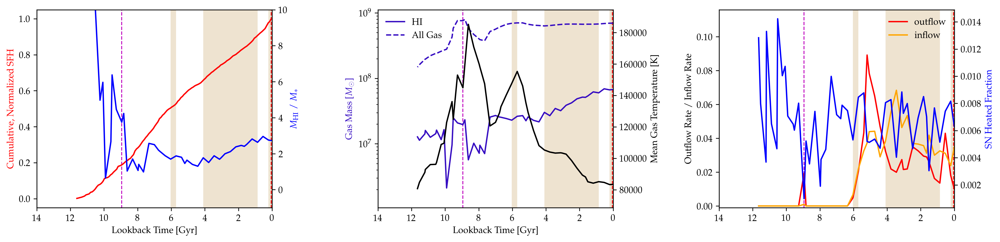

Halo 21.0
Gathering data...


<Figure size 432x288 with 0 Axes>

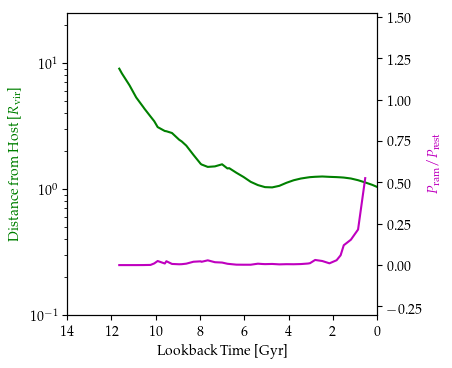

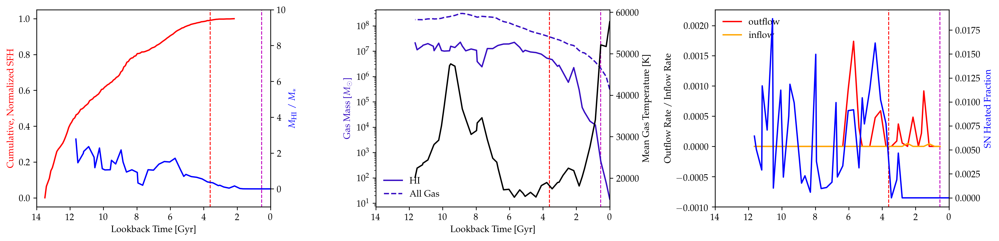

Halo 27.0
Gathering data...


<Figure size 432x288 with 0 Axes>

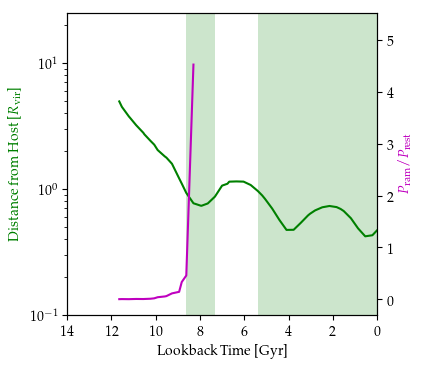

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


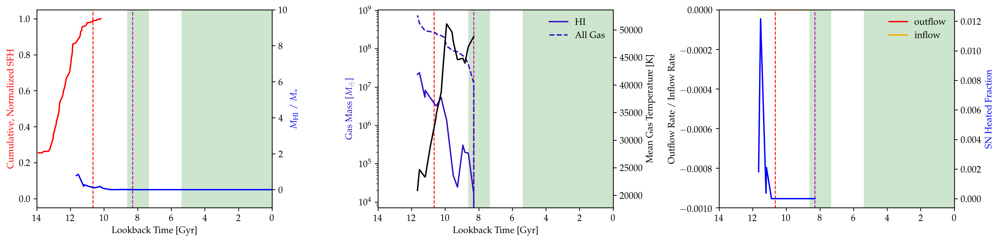

Halo 31.0
Gathering data...


<Figure size 432x288 with 0 Axes>

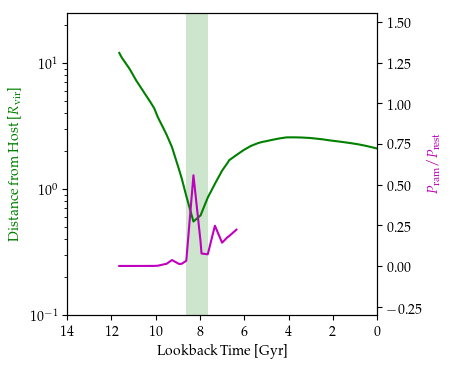

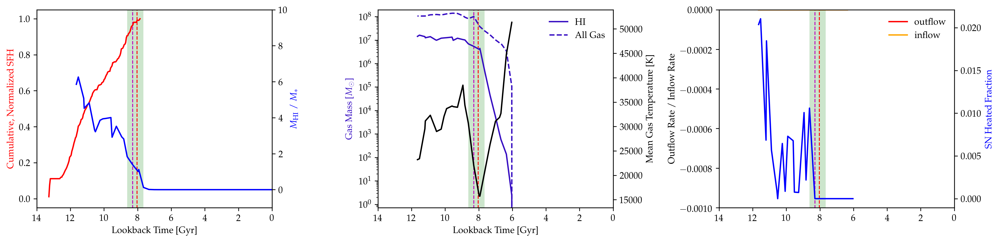

Halo 35.0
Gathering data...


<Figure size 432x288 with 0 Axes>

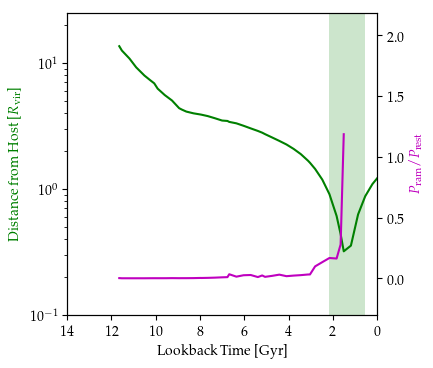

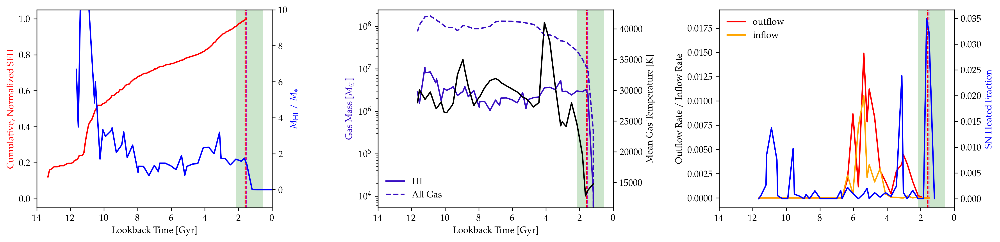

Halo 36.0
Gathering data...


<Figure size 432x288 with 0 Axes>

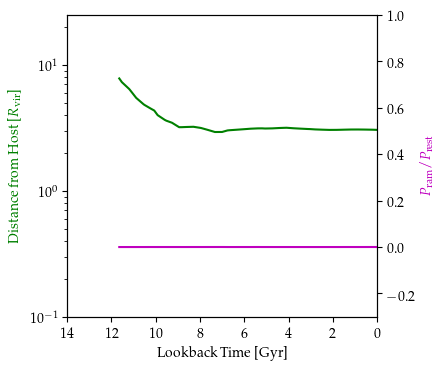

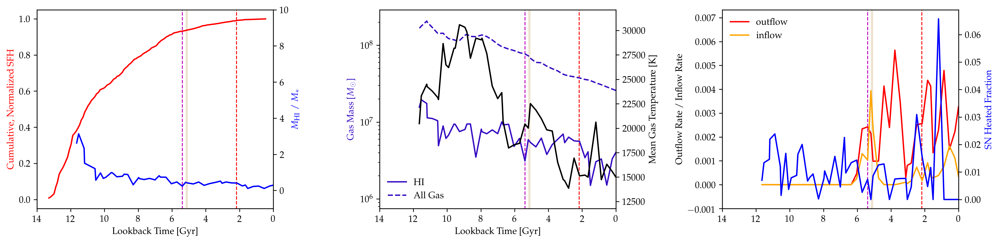

Halo 37.0
Gathering data...


<Figure size 432x288 with 0 Axes>

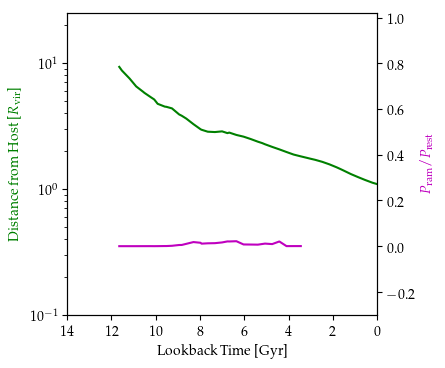

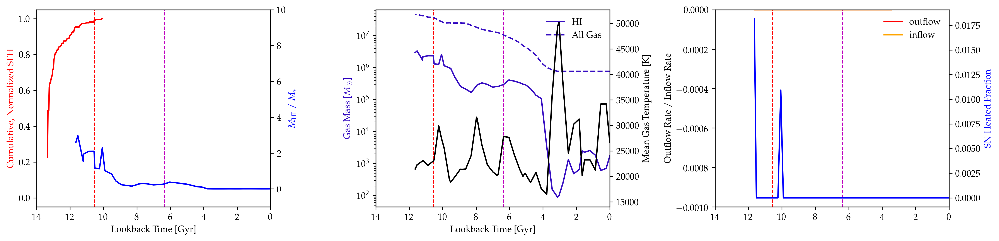

Halo 45.0
Gathering data...


<Figure size 432x288 with 0 Axes>

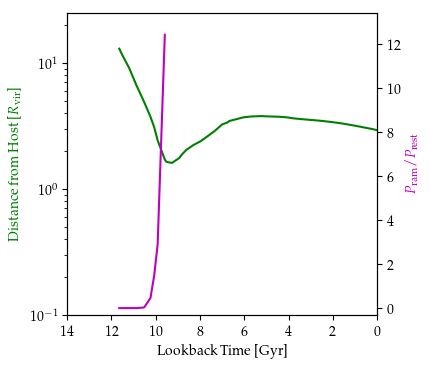

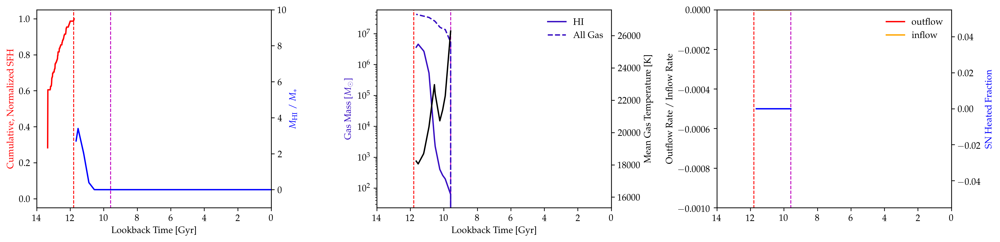

Halo 47.0
Gathering data...


<Figure size 432x288 with 0 Axes>

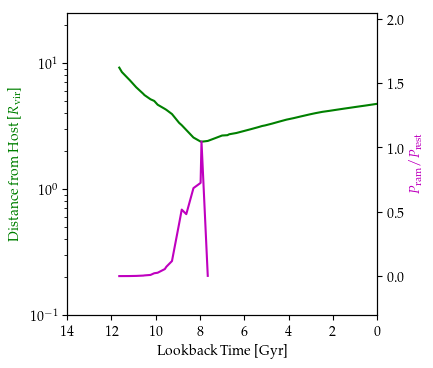

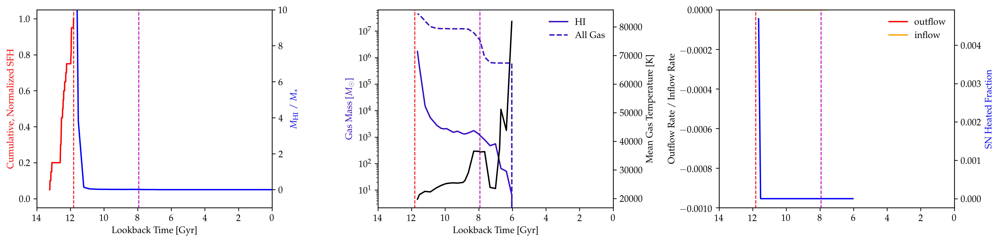

Halo 48.0
Gathering data...


<Figure size 432x288 with 0 Axes>

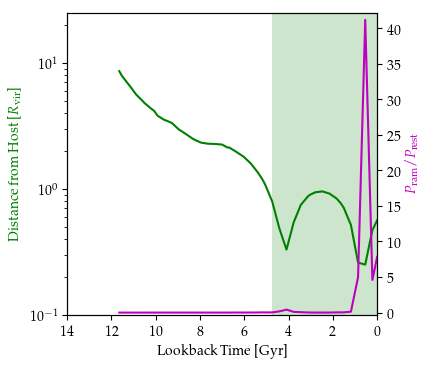

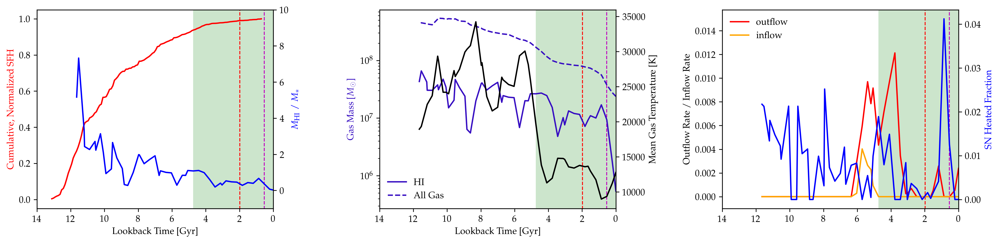

Halo 49.0
Gathering data...


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/pynbody/plot/stars.py:632: RuntimeWarning: divide by zero encountered in true_divide
  binnorm = 1e-9 * bins / (trange[1] - trange[0])
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/pynbody/array.py:346: RuntimeWarning: invalid value encountered in true_divide
  return np.ndarray.__truediv__(self, rhs)


<Figure size 432x288 with 0 Axes>

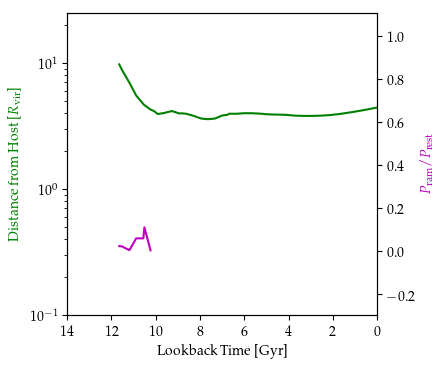

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in greater_equal


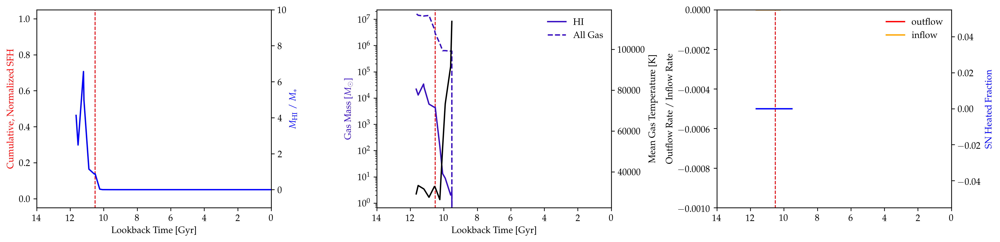

Halo 59.0
Gathering data...


<Figure size 432x288 with 0 Axes>

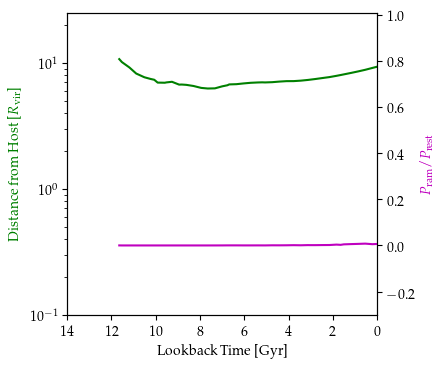

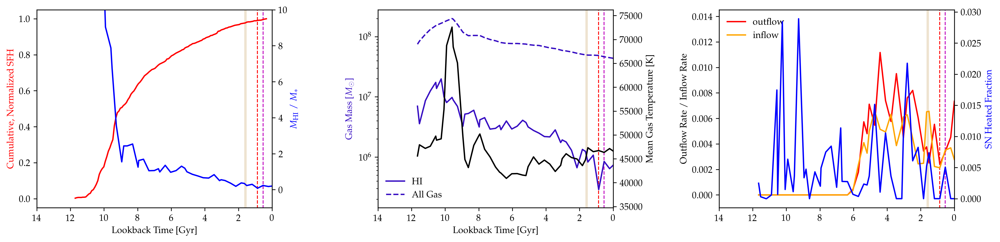

Halo 64.0
Gathering data...


<Figure size 432x288 with 0 Axes>

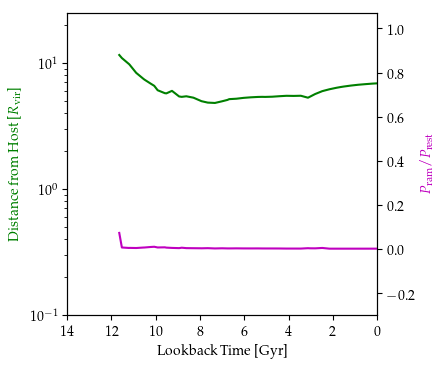

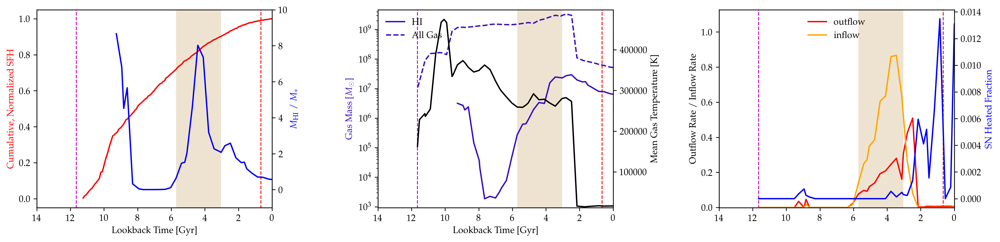

Halo 65.0
Gathering data...


<Figure size 432x288 with 0 Axes>

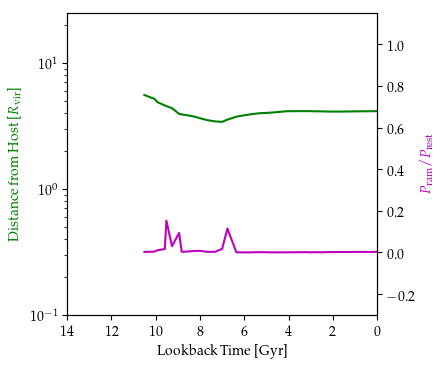

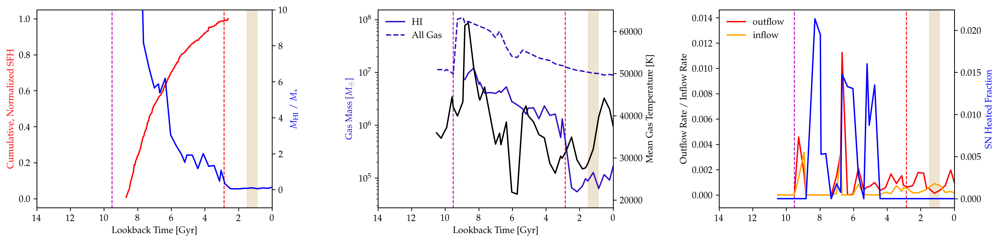

Halo 67.0
Gathering data...


<Figure size 432x288 with 0 Axes>

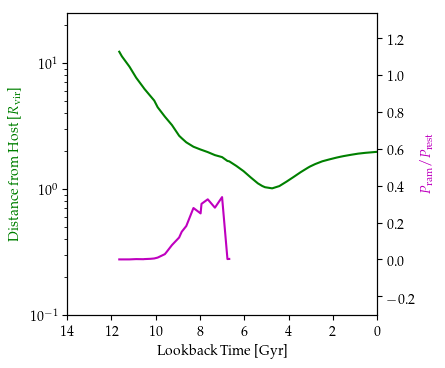

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


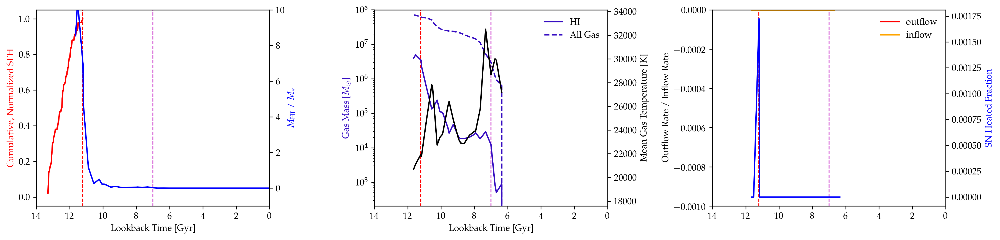

Halo 68.0
Gathering data...


<Figure size 432x288 with 0 Axes>

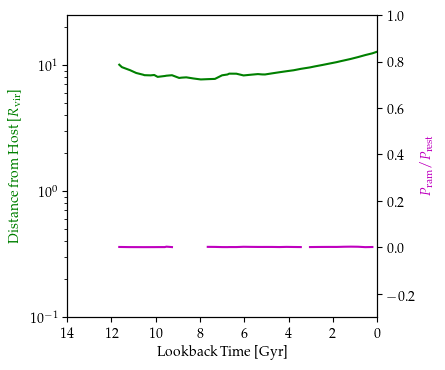

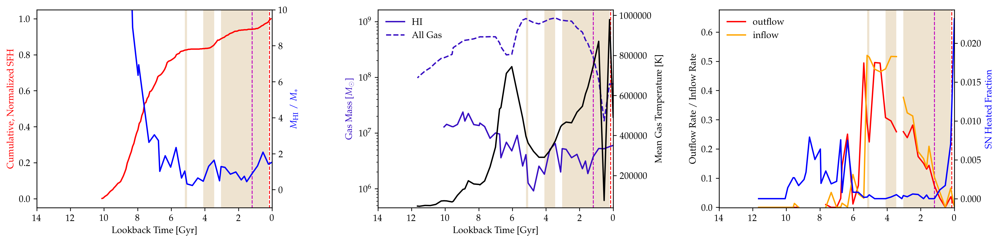

Halo 70.0
Gathering data...


<Figure size 432x288 with 0 Axes>

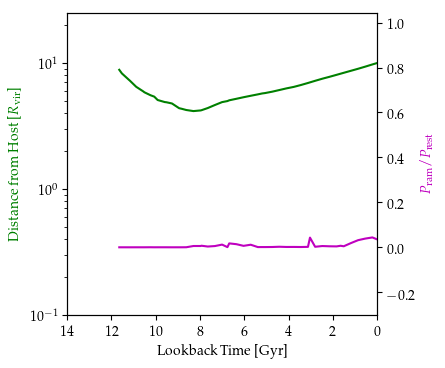

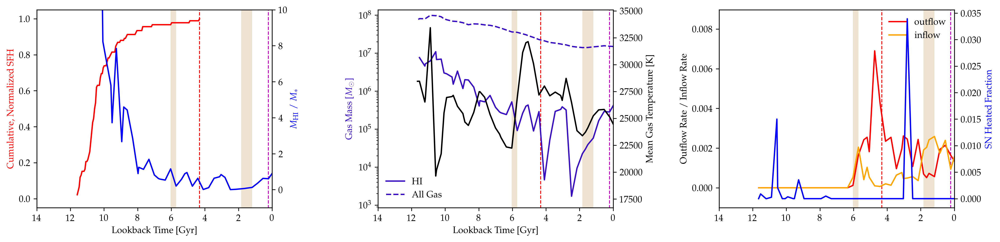

Halo 71.0
Gathering data...


<Figure size 432x288 with 0 Axes>

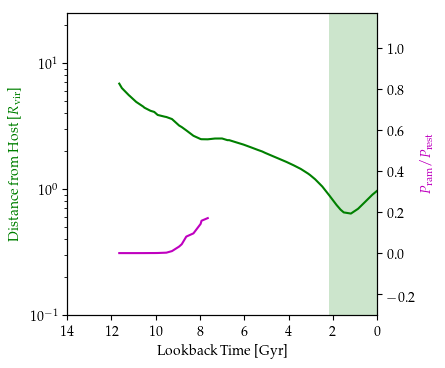

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


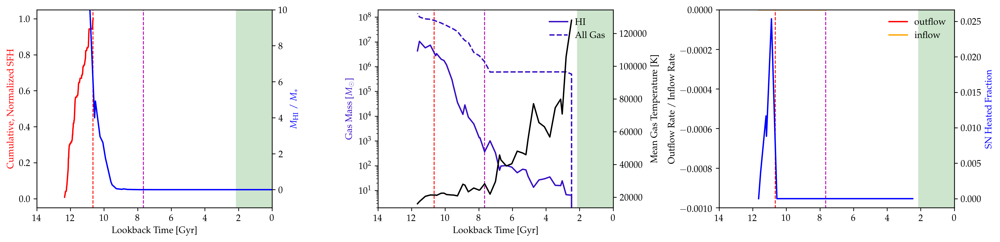

Halo 77.0
Gathering data...


<Figure size 432x288 with 0 Axes>

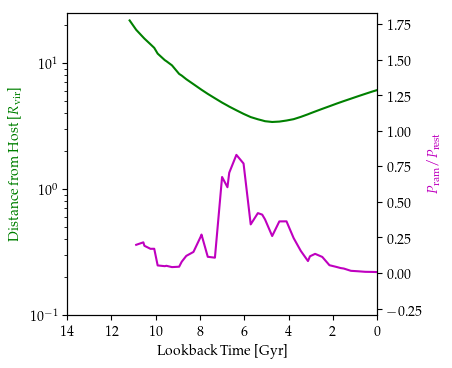

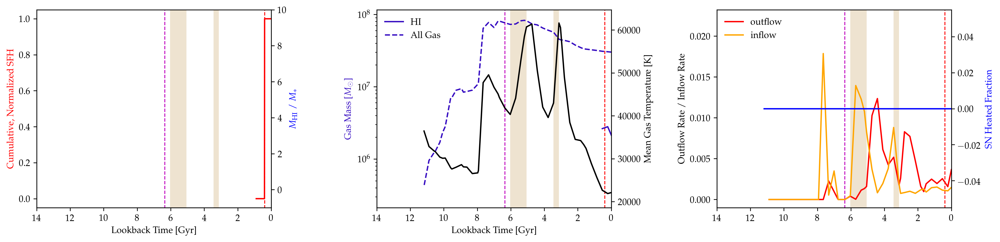

Halo 81.0
Gathering data...


<Figure size 432x288 with 0 Axes>

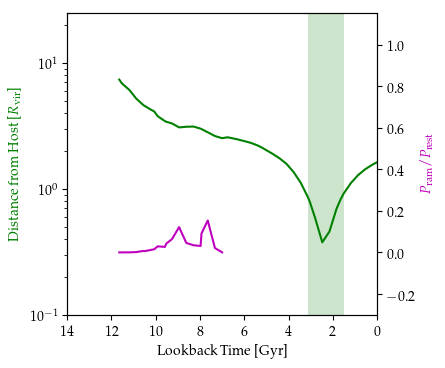

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


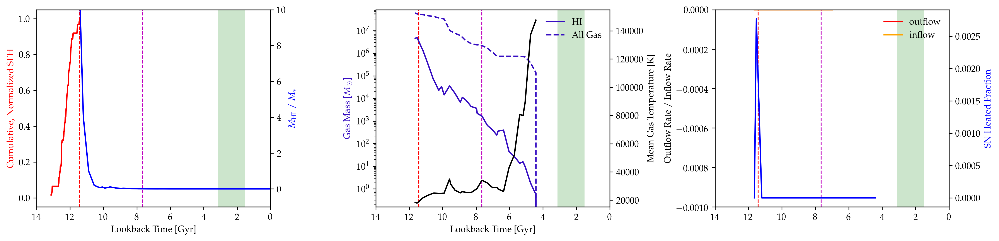

Halo 90.0
Gathering data...


<Figure size 432x288 with 0 Axes>

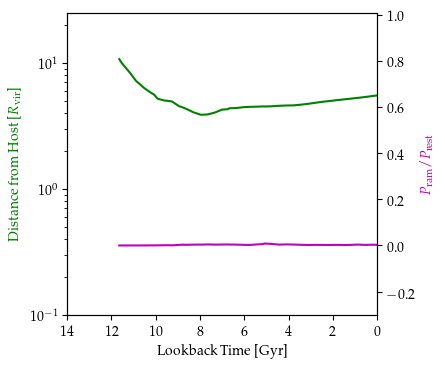

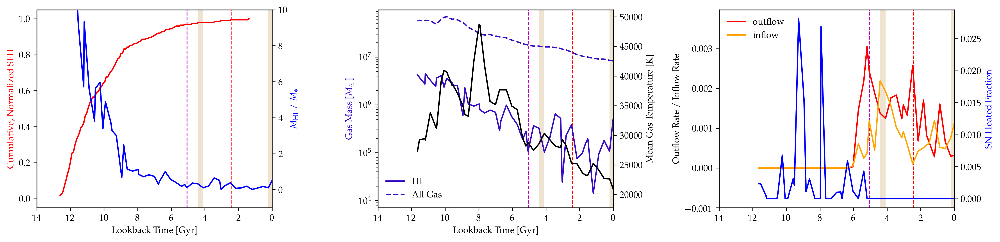

Halo 100.0
Gathering data...


<Figure size 432x288 with 0 Axes>

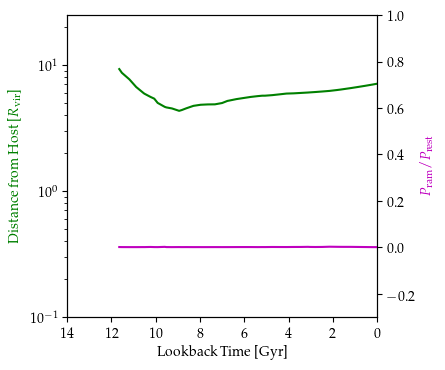

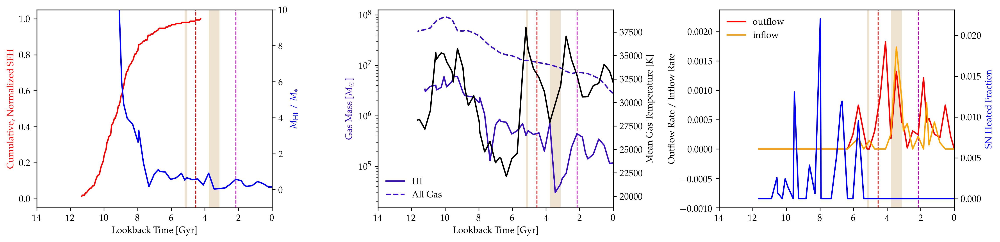

Halo 102.0
Gathering data...


<Figure size 432x288 with 0 Axes>

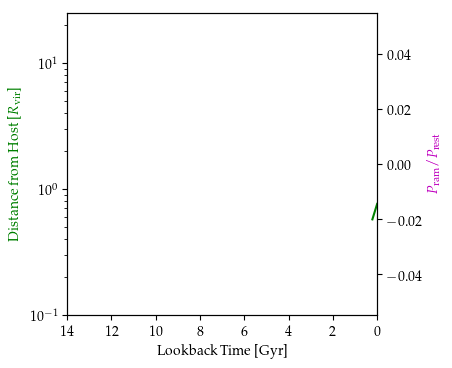

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/ticker.py:2241: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0


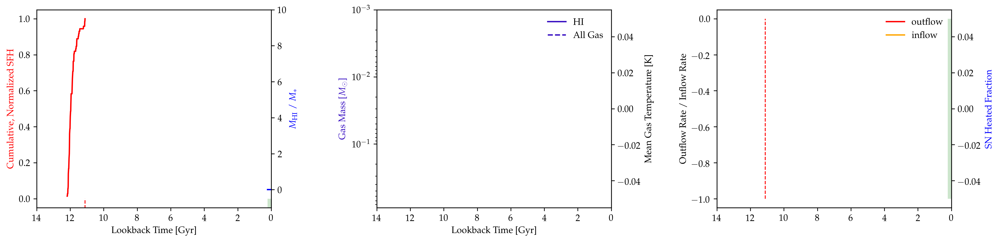

Halo 131.0
Gathering data...


<Figure size 432x288 with 0 Axes>

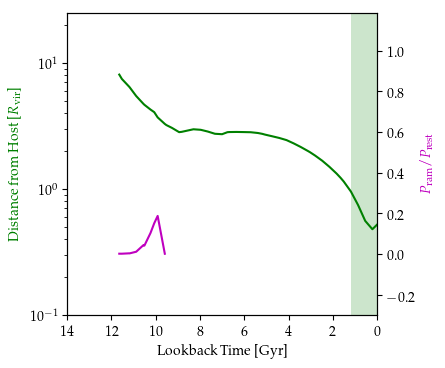

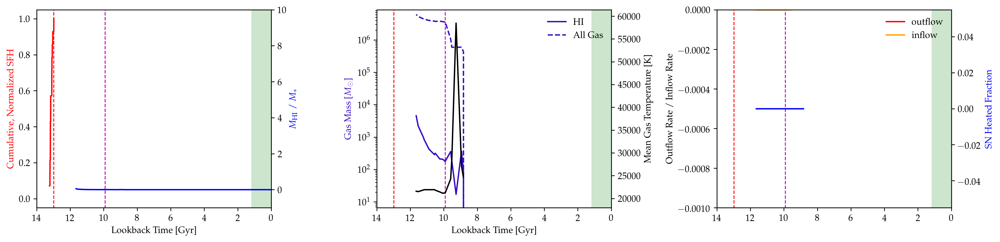

Halo 137.0
Gathering data...


<Figure size 432x288 with 0 Axes>

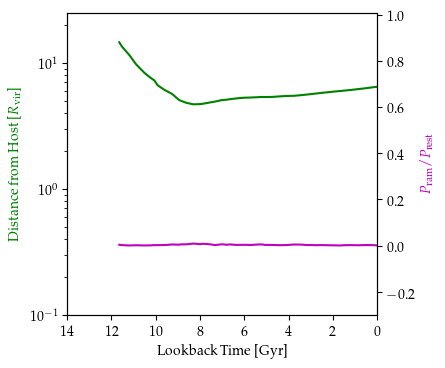

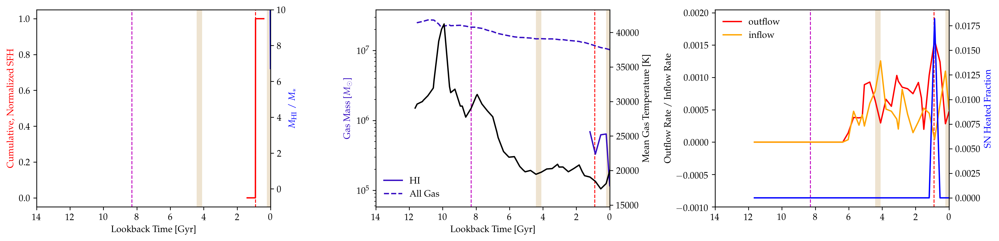

Halo 195.0
Gathering data...


<Figure size 432x288 with 0 Axes>

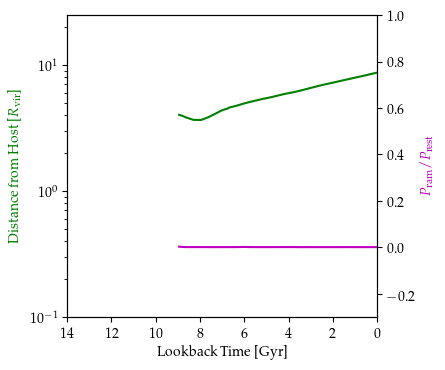

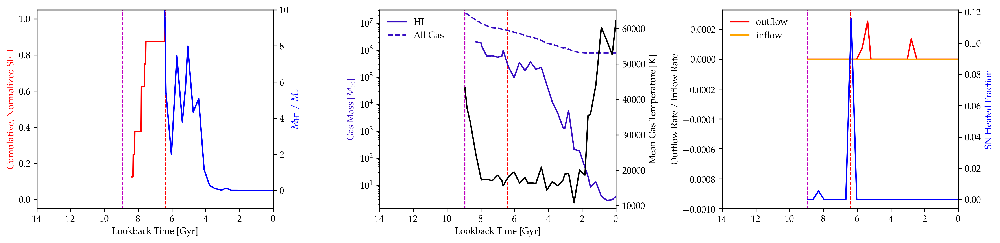

Halo 205.0
Gathering data...


<Figure size 432x288 with 0 Axes>

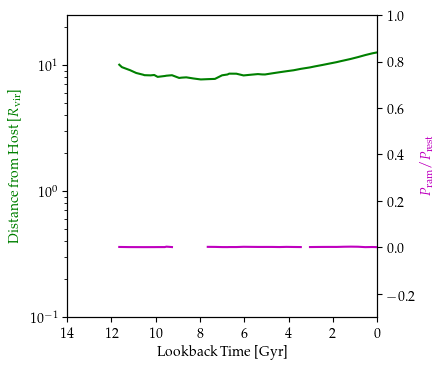

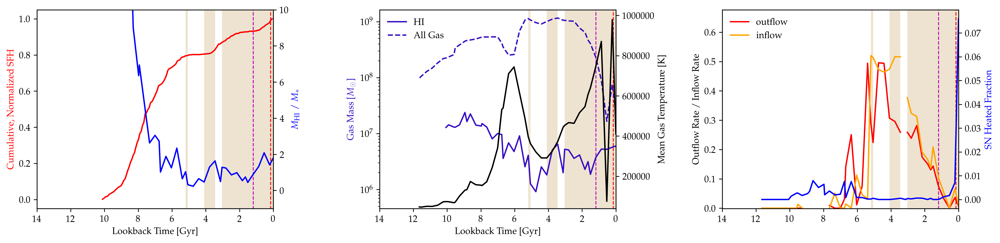

Halo 407.0
Gathering data...


<Figure size 432x288 with 0 Axes>

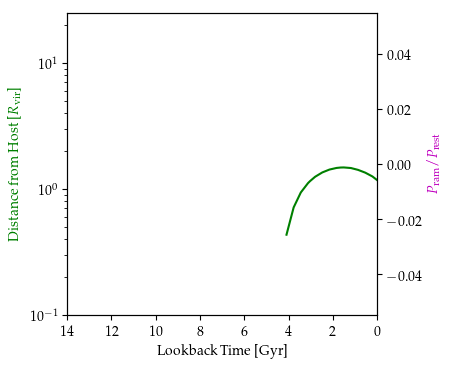

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/ticker.py:2241: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


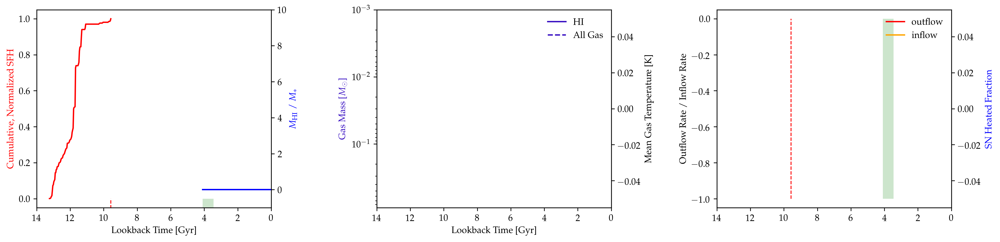

Halo 418.0
Gathering data...


<Figure size 432x288 with 0 Axes>

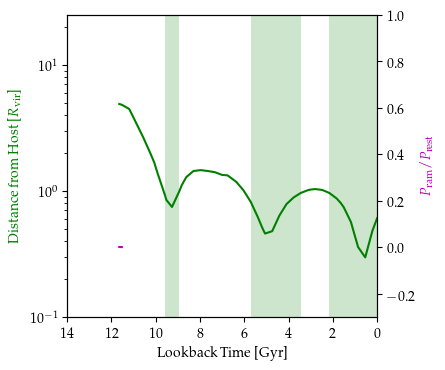

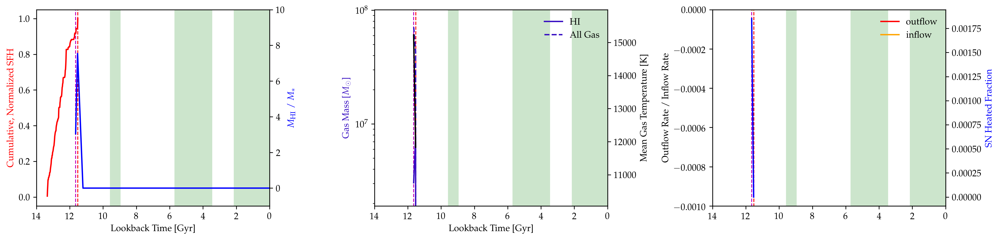

Halo 443.0
Gathering data...


<Figure size 432x288 with 0 Axes>

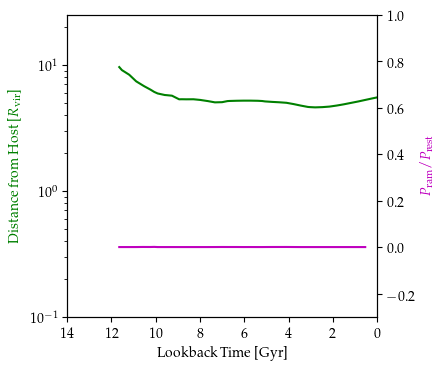

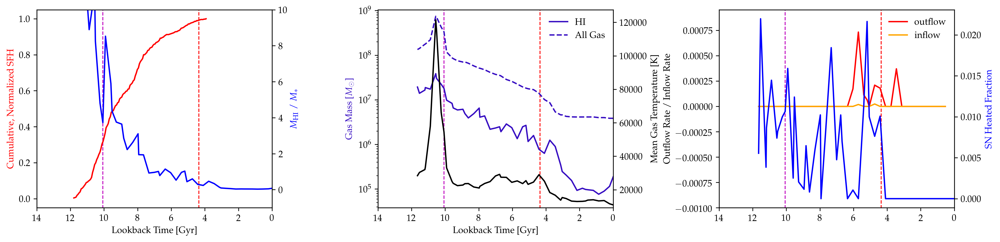

In [55]:
data = read_file('/home/akinshol/Data/Timescales/DataFiles/h242.data','all')

for haloid in np.unique(data.z0haloid):
    print(f'Halo {haloid}')
    CaseStudyPlots(haloid,'h242')

Gathering data...


<Figure size 432x288 with 0 Axes>

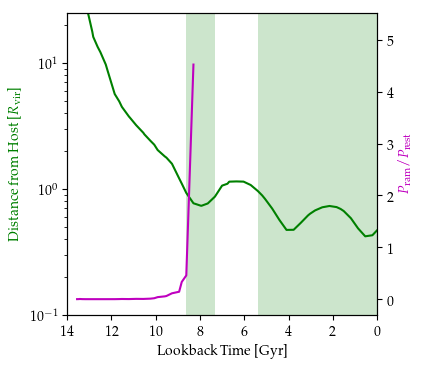

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:106: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


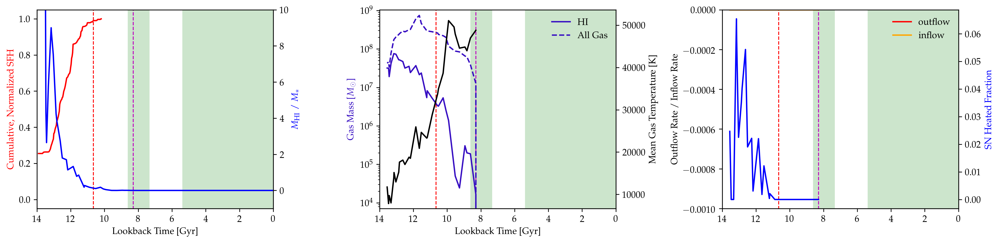

In [75]:
CaseStudyPlots(27,'h242')

In [76]:
data = read_file('/home/akinshol/Data/Timescales/DataFiles/h329.data',116)
c_sfh, bc = cumulative_sfh(116)

Cannot create SFH, only 0 star particles


ValueError: zero-size array to reduction operation minimum which has no identity

In [63]:
tquench = age - np.max(bc[c_sfh > 0.9])
print(tquench)

7.7884319796180534


In [66]:
time_until_quench = np.array(tquench - data.time)

print(time_until_quench)

[13.8007975  13.58530731 13.26207202 12.93883674 12.61560145 12.29236617
 12.15095073 11.96913088 11.6458956  11.32266031 10.99942502 10.76709966
 10.67618974 10.35295445 10.02971917  9.70648388  9.3832486   9.06001331
  8.73677803  8.60883073  8.41354274  8.09030746  7.76707217  7.44383689
  7.1206016   7.03979278  6.79736632  6.47413103  6.15089574  5.86806487
  5.82766046  5.50442517  5.18118989  4.9758008   4.8579546   4.53471932
  4.28219175  4.21148403  3.88824875  3.73336517  3.56501346  3.28891666
  3.24177818  2.91854289  2.62224388  2.59530761  2.27207232  2.15422612
  1.94883704  1.62560175  1.54479293  1.30236646  1.1777862   0.97913118
  0.93535973  0.76700802  0.65589589  0.64242776  0.47744308  0.36969799
  0.33266061  0.24848475]
[-6.01236552 -5.79687533 -5.47364004 -5.15040476 -4.82716947 -4.50393419
 -4.36251875 -4.1806989  -3.85746362 -3.53422833 -3.21099304 -2.97866768
 -2.88775776 -2.56452247 -2.24128719 -1.9180519  -1.59481662 -1.27158133
 -0.94834605 -0.82039875 

In [69]:
sfr = np.array(data.sfr[time_until_quench > 0], dtype=float)
mHI = np.array(data.mHI[time_until_quench > 0], dtype=float)
HI_depletion_times = mHI / sfr / 1e9
print(HI_depletion_times)

[ 17.9112439   20.78954086  22.33506323  12.99195911  20.45916935
  25.76525781   2.44435998   1.69556322   4.78787251  26.05246557
   8.54921676   8.33310244  12.4323949   11.85904819   9.55876898
  16.48668992   5.80101696   4.24865986  15.52069033   5.85036824
   7.25882348  12.95200163  15.93095681  25.05655543   7.72494068
  10.37692253   7.96058736   6.62431185  11.36369734  10.60906492
   6.81682263   4.48812536   8.61038868   9.10710825  10.51645092
  12.82254765   5.28529049          inf 603.93616014          inf]


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


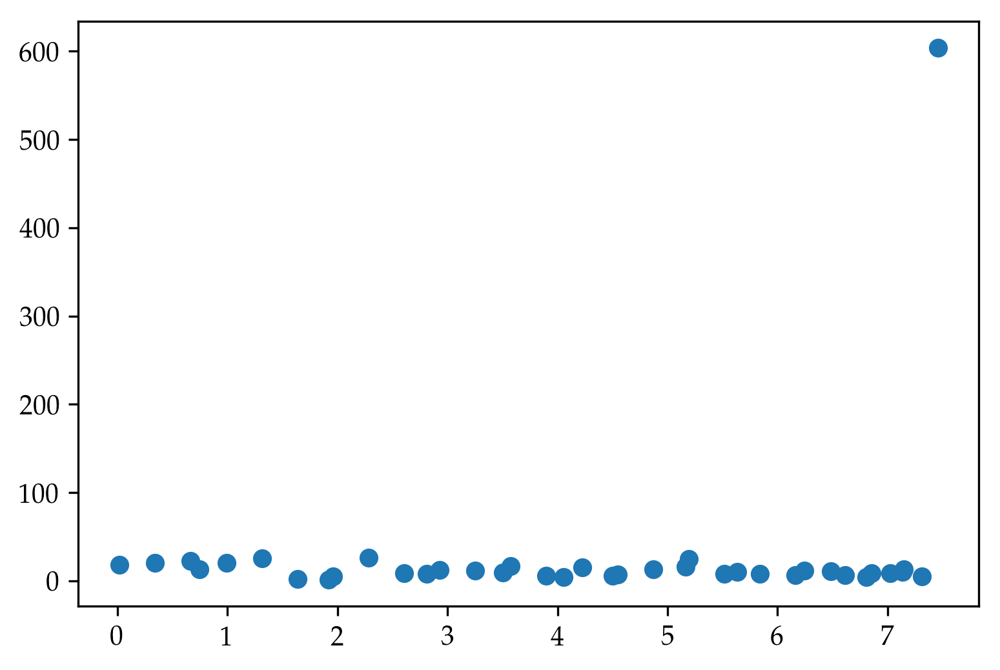

In [74]:
plt.figure(dpi=300)
plt.scatter(time_until_quench[time_until_quench > 0], HI_depletion_times)
plt.ylim()
plt.show()

In [ ]:
for sim, i in 